<a href="https://colab.research.google.com/github/fms-faisal/Impact-of-Digital-Image-Processing-on-Model-Performance/blob/main/DIP_implementation_part_01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **AlexNet**

# **Gaussian Blur**

Mounted at /content/drive
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Epoch 1 Train:   0%|           | 0/101 [00:00<?, ?it/s]<ipython-input-2-18c3147a4fa5>:110: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: 1.0685  Acc: 0.6730


Val Loss: 1.0362  Acc: 0.7264

Epoch 2/10 ====================


Train Loss: 0.4122  Acc: 0.8696


Val Loss: 1.8042  Acc: 0.6586

Epoch 3/10 ====================


Train Loss: 0.2975  Acc: 0.9027


Val Loss: 1.4759  Acc: 0.6465

Epoch 4/10 ====================


Train Loss: 0.2194  Acc: 0.9331


Val Loss: 1.6926  Acc: 0.6223

Epoch 5/10 ====================


Train Loss: 0.1383  Acc: 0.9559


Val Loss: 1.1703  Acc: 0.7433

Epoch 6/10 ====================


Train Loss: 0.1082  Acc: 0.9665


Val Loss: 1.1520  Acc: 0.7893

Epoch 7/10 ====================


Train Loss: 0.0834  Acc: 0.9739


Val Loss: 2.3886  Acc: 0.6562

Epoch 8/10 ====================


Train Loss: 0.0939  Acc: 0.9690


Val Loss: 1.3961  Acc: 0.7676

Epoch 9/10 ====================


Train Loss: 0.0851  Acc: 0.9716


Val Loss: 2.1120  Acc: 0.6780

Epoch 10/10 ====================


Train Loss: 0.0595  Acc: 0.9808


Val Loss: 2.5134  Acc: 0.6707

Training complete in 4m 52s
Best validation accuracy: 0.7893



--- Test Metrics ---
Test Accuracy : 0.6438
Precision     : 0.8086
Recall        : 0.6438
F1 Score      : 0.6491

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.20      0.80      0.32        20
                  Black Hairy       0.75      0.30      0.43        20
                      Cutworm       1.00      0.20      0.33        20
                Field Cricket       0.50      0.05      0.09        20
                   Jute Aphid       0.42      0.95      0.58        22
                   Jute Hairy       0.80      0.20      0.32        20
                Jute Red Mite       0.85      0.96      0.90        24
              Jute Semilooper       1.00      0.86      0.92        21
            Jute Stem Girdler       1.00      0.62      0.77        24
             Jute Stem Weevil       0.48      1.00      0.65        24
                  Leaf Beetle       1.00      0.79      0.88        24
         

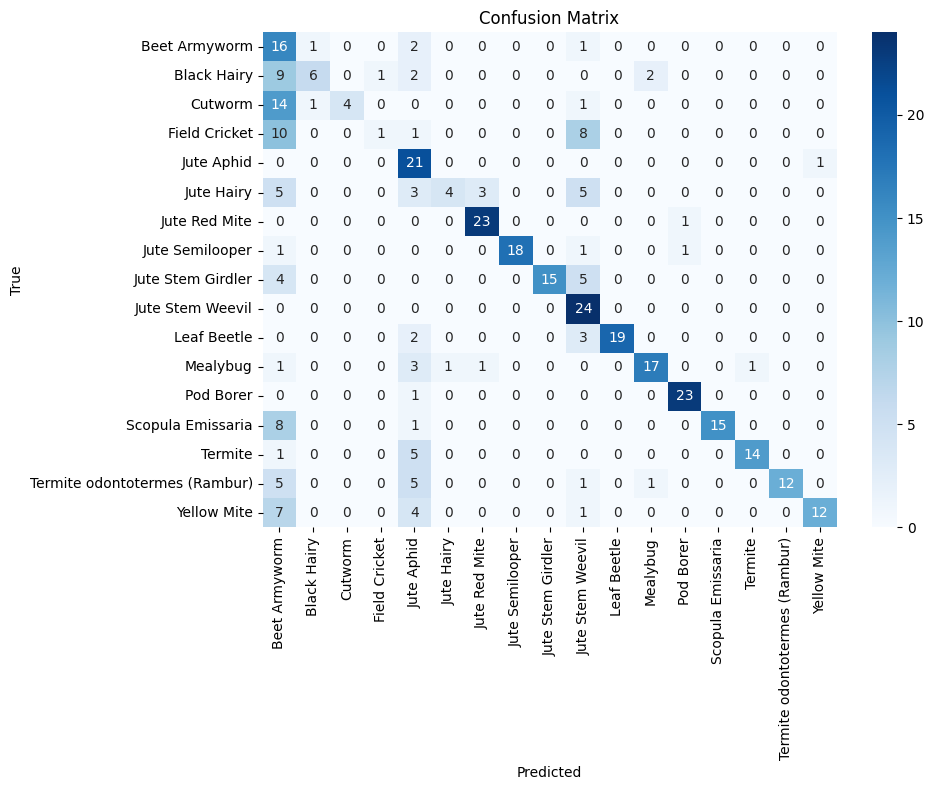


--- Sample Predictions from Blurred Training Dataset ---


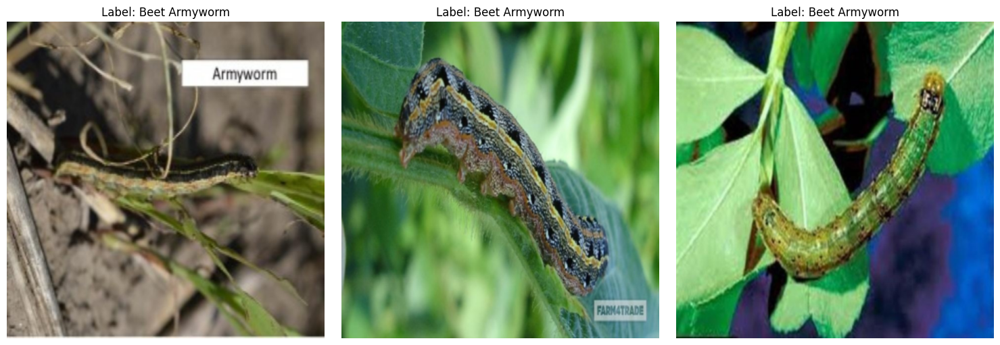

In [ ]:
# Google Colab: Mount Drive (only for copying original dataset)
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
BLURRED_DATASET_DIR = '/content/jute_pest_dataset_blurred'  # Store blurred dataset locally in Colab
BASE_DIR = "/content/jute_pest_dataset"  # Local directory for original dataset

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Process dataset with Gaussian blur (only for training data)
TRAIN_DIR = os.path.join(BASE_DIR, "train")
BLURRED_TRAIN_DIR = os.path.join(BLURRED_DATASET_DIR, "train")

os.makedirs(BLURRED_TRAIN_DIR, exist_ok=True)

for class_name in os.listdir(TRAIN_DIR):
    class_dir = os.path.join(TRAIN_DIR, class_name)
    if os.path.isdir(class_dir):
        blurred_class_dir = os.path.join(BLURRED_TRAIN_DIR, class_name)
        os.makedirs(blurred_class_dir, exist_ok=True)
        for img_name in os.listdir(class_dir):
            if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                img_path = os.path.join(class_dir, img_name)
                img = cv2.imread(img_path)
                blurred_img = cv2.GaussianBlur(img, (5, 5), 0)  # Apply Gaussian blur
                cv2.imwrite(os.path.join(blurred_class_dir, img_name), blurred_img)

# Paths for validation and test datasets
VAL_DIR = os.path.join(BASE_DIR, "val")
TEST_DIR = os.path.join(BASE_DIR, "test")

assert os.path.exists(BLURRED_TRAIN_DIR)
assert os.path.exists(VAL_DIR)
assert os.path.exists(TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase],
                        desc=f"Epoch {epoch+1} {phase.capitalize()}",
                        leave=False,
                        dynamic_ncols=True,
                        mininterval=1.0,
                        bar_format='{l_bar}{bar} | {n_fmt}/{total_fmt} [{elapsed}<{remaining}, {rate_fmt}]')
            for inputs, labels in pbar:
                inputs = inputs.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)
                optimizer.zero_grad(set_to_none=True)
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_best_jute_pest_model.pth"))
            pbar.close()
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main Code
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    # Transforms
    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(BLURRED_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True,
                            persistent_workers=True, prefetch_factor=4),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True,
                          persistent_workers=True, prefetch_factor=4),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True,
                           persistent_workers=True, prefetch_factor=4)
    }

    # === AlexNet Model ===
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "final_jute_pest_model.pth"))

    # === Test Phase ===
    model.eval()
    test_results = []
    all_preds = []
    all_labels = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing", leave=False):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    # Save test results
    with open(os.path.join(BASE_DIR, "alexnet_test_results.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    # Metrics
    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    # Confusion Matrix
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_confusion_matrix.png"))
    plt.show()

    # === Show 3 Sample Predictions from Blurred Training Dataset ===
    print("\n--- Sample Predictions from Blurred Training Dataset ---")
    blurred_train_dataset = JutePestDataset(BLURRED_TRAIN_DIR, transform=data_transforms["train"])
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    for i, ax in enumerate(axes):
        img_path, label = blurred_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {blurred_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sample_predictions_blurred_train.png"))
    plt.show()

    # Save training log
    with open(os.path.join(BASE_DIR, "alexnet_training_logs.json"), "w") as f:
        json.dump(training_logs, f, indent=4)

# **Gaussian Blur on val and test as well**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Epoch 1 Train:   0%|           | 0/101 [00:00<?, ?it/s]<ipython-input-6-0784ebf01e1e>:116: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: 1.0020  Acc: 0.6916


Val Loss: 1.0326  Acc: 0.7070

Epoch 2/10 ====================


Train Loss: 0.4667  Acc: 0.8566


Val Loss: 1.0854  Acc: 0.7651

Epoch 3/10 ====================


Train Loss: 0.2797  Acc: 0.9125


Val Loss: 0.8614  Acc: 0.7869

Epoch 4/10 ====================


Train Loss: 0.1882  Acc: 0.9452


Val Loss: 1.0673  Acc: 0.8063

Epoch 5/10 ====================


Train Loss: 0.1501  Acc: 0.9530


Val Loss: 0.9641  Acc: 0.8450

Epoch 6/10 ====================


Train Loss: 0.1112  Acc: 0.9651


Val Loss: 0.8059  Acc: 0.8378

Epoch 7/10 ====================


Train Loss: 0.0947  Acc: 0.9686


Val Loss: 1.1045  Acc: 0.8063

Epoch 8/10 ====================


Train Loss: 0.1092  Acc: 0.9651


Val Loss: 0.8236  Acc: 0.8426

Epoch 9/10 ====================


Train Loss: 0.0811  Acc: 0.9738


Val Loss: 0.9818  Acc: 0.8305

Epoch 10/10 ====================


Train Loss: 0.1013  Acc: 0.9694


Val Loss: 0.9163  Acc: 0.8571

Training complete in 5m 42s
Best validation accuracy: 0.8571



--- Test Metrics ---
Test Accuracy : 0.9288
Precision     : 0.9403
Recall        : 0.9288
F1 Score      : 0.9290

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.76      0.80      0.78        20
                  Black Hairy       0.95      0.95      0.95        20
                      Cutworm       1.00      0.75      0.86        20
                Field Cricket       0.95      1.00      0.98        20
                   Jute Aphid       0.73      1.00      0.85        22
                   Jute Hairy       0.95      1.00      0.98        20
                Jute Red Mite       1.00      0.88      0.93        24
              Jute Semilooper       1.00      0.76      0.86        21
            Jute Stem Girdler       0.96      0.96      0.96        24
             Jute Stem Weevil       1.00      1.00      1.00        24
                  Leaf Beetle       1.00      1.00      1.00        24
         

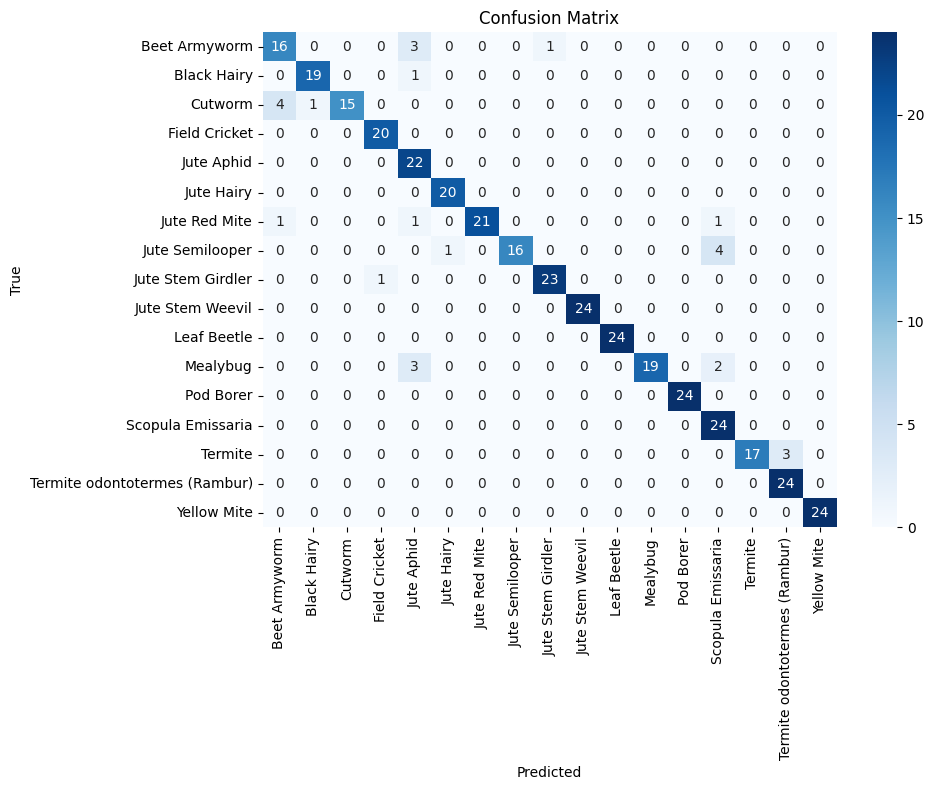


--- Sample Predictions from Blurred Training Dataset ---


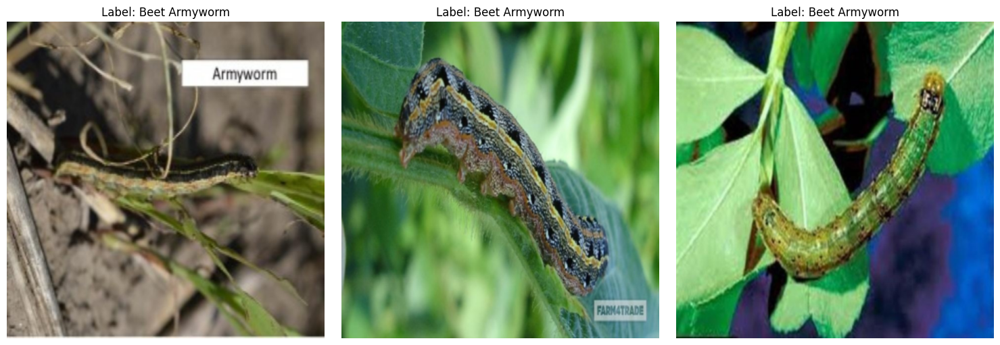

In [ ]:
# Google Colab: Mount Drive (only for copying original dataset)
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
BLURRED_DATASET_DIR = '/content/jute_pest_dataset_blurred'
BASE_DIR = "/content/jute_pest_dataset"

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply Gaussian Blur to Train, Val, and Test Datasets
def apply_blur_to_dataset(src_dir, dest_dir):
    os.makedirs(dest_dir, exist_ok=True)
    for class_name in os.listdir(src_dir):
        class_dir = os.path.join(src_dir, class_name)
        if os.path.isdir(class_dir):
            blurred_class_dir = os.path.join(dest_dir, class_name)
            os.makedirs(blurred_class_dir, exist_ok=True)
            for img_name in os.listdir(class_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(class_dir, img_name)
                    img = cv2.imread(img_path)
                    blurred_img = cv2.GaussianBlur(img, (5, 5), 0)
                    cv2.imwrite(os.path.join(blurred_class_dir, img_name), blurred_img)

# Apply blur
TRAIN_DIR = os.path.join(BASE_DIR, "train")
VAL_DIR = os.path.join(BASE_DIR, "val")
TEST_DIR = os.path.join(BASE_DIR, "test")

BLURRED_TRAIN_DIR = os.path.join(BLURRED_DATASET_DIR, "train")
BLURRED_VAL_DIR = os.path.join(BLURRED_DATASET_DIR, "val")
BLURRED_TEST_DIR = os.path.join(BLURRED_DATASET_DIR, "test")

apply_blur_to_dataset(TRAIN_DIR, BLURRED_TRAIN_DIR)
apply_blur_to_dataset(VAL_DIR, BLURRED_VAL_DIR)
apply_blur_to_dataset(TEST_DIR, BLURRED_TEST_DIR)

assert os.path.exists(BLURRED_TRAIN_DIR)
assert os.path.exists(BLURRED_VAL_DIR)
assert os.path.exists(BLURRED_TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase],
                        desc=f"Epoch {epoch+1} {phase.capitalize()}",
                        leave=False,
                        dynamic_ncols=True,
                        mininterval=1.0,
                        bar_format='{l_bar}{bar} | {n_fmt}/{total_fmt} [{elapsed}<{remaining}, {rate_fmt}]')
            for inputs, labels in pbar:
                inputs = inputs.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)
                optimizer.zero_grad(set_to_none=True)
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_best_jute_pest_model.pth"))
            pbar.close()
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main Code
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    # Transforms
    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(BLURRED_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(BLURRED_VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(BLURRED_TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True,
                            persistent_workers=True, prefetch_factor=4),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True,
                          persistent_workers=True, prefetch_factor=4),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True,
                           persistent_workers=True, prefetch_factor=4)
    }

    # === AlexNet Model ===
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "final_jute_pest_model.pth"))

    # === Test Phase ===
    model.eval()
    test_results = []
    all_preds = []
    all_labels = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing", leave=False):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_test_results.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_confusion_matrix.png"))
    plt.show()

    print("\n--- Sample Predictions from Blurred Training Dataset ---")
    blurred_train_dataset = JutePestDataset(BLURRED_TRAIN_DIR, transform=data_transforms["train"])
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    for i, ax in enumerate(axes):
        img_path, label = blurred_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {blurred_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sample_predictions_blurred_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_training_logs.json"), "w") as f:
        json.dump(training_logs, f, indent=4)


# **Median Filter**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Epoch 1 Train:   0%|           | 0/101 [00:00<?, ?it/s]<ipython-input-3-0ffee013dbe1>:110: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: 0.9373  Acc: 0.7096


Val Loss: 1.2688  Acc: 0.6998

Epoch 2/10 ====================


Train Loss: 0.4529  Acc: 0.8706


Val Loss: 1.1995  Acc: 0.6634

Epoch 3/10 ====================


Train Loss: 0.2944  Acc: 0.9086


Val Loss: 1.3818  Acc: 0.7070

Epoch 4/10 ====================


Train Loss: 0.1907  Acc: 0.9421


Val Loss: 1.4312  Acc: 0.7119

Epoch 5/10 ====================


Train Loss: 0.1376  Acc: 0.9570


Val Loss: 1.6960  Acc: 0.6901

Epoch 6/10 ====================


Train Loss: 0.1612  Acc: 0.9510


Val Loss: 2.9965  Acc: 0.5956

Epoch 7/10 ====================


Train Loss: 0.1519  Acc: 0.9519


Val Loss: 2.1937  Acc: 0.6659

Epoch 8/10 ====================


Train Loss: 0.1199  Acc: 0.9629


Val Loss: 1.2670  Acc: 0.7264

Epoch 9/10 ====================


Train Loss: 0.1315  Acc: 0.9590


Val Loss: 1.6094  Acc: 0.6852

Epoch 10/10 ====================


Train Loss: 0.0661  Acc: 0.9812


Val Loss: 1.4785  Acc: 0.7191

Training complete in 5m 3s
Best validation accuracy: 0.7264



--- Test Metrics ---
Test Accuracy : 0.7071
Precision     : 0.8680
Recall        : 0.7071
F1 Score      : 0.7217

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.22      0.75      0.34        20
                  Black Hairy       1.00      0.40      0.57        20
                      Cutworm       1.00      0.25      0.40        20
                Field Cricket       1.00      0.10      0.18        20
                   Jute Aphid       0.36      1.00      0.53        22
                   Jute Hairy       0.75      0.45      0.56        20
                Jute Red Mite       0.74      0.96      0.84        24
              Jute Semilooper       1.00      0.67      0.80        21
            Jute Stem Girdler       1.00      0.79      0.88        24
             Jute Stem Weevil       1.00      1.00      1.00        24
                  Leaf Beetle       0.95      0.88      0.91        24
         

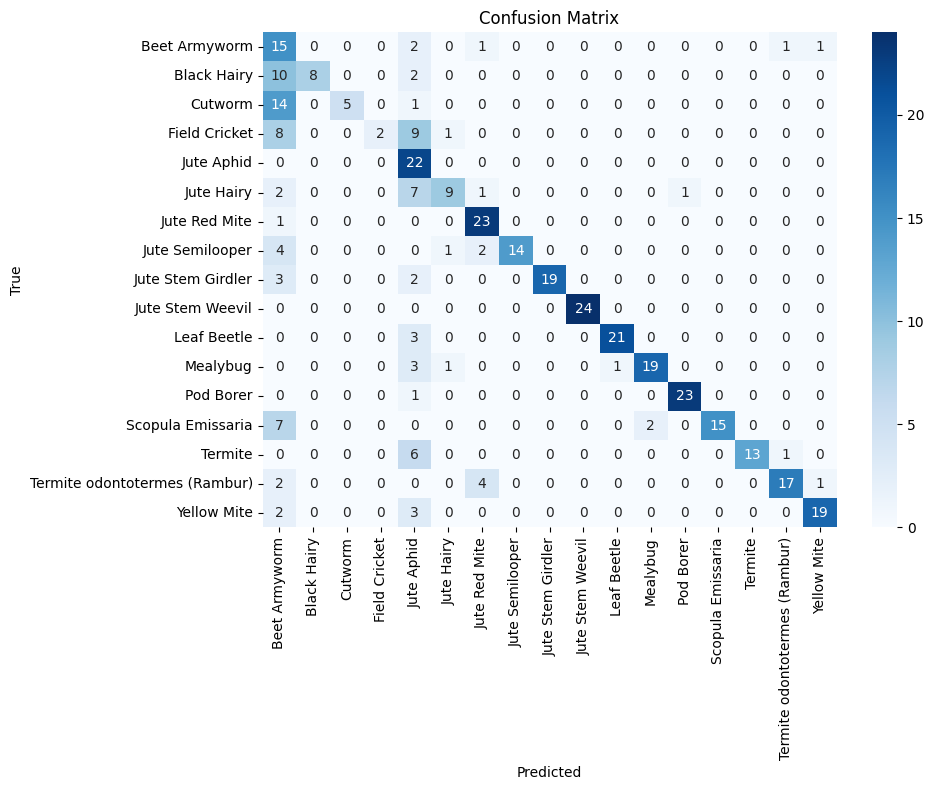


--- Sample Predictions from Median Filtered Training Dataset ---


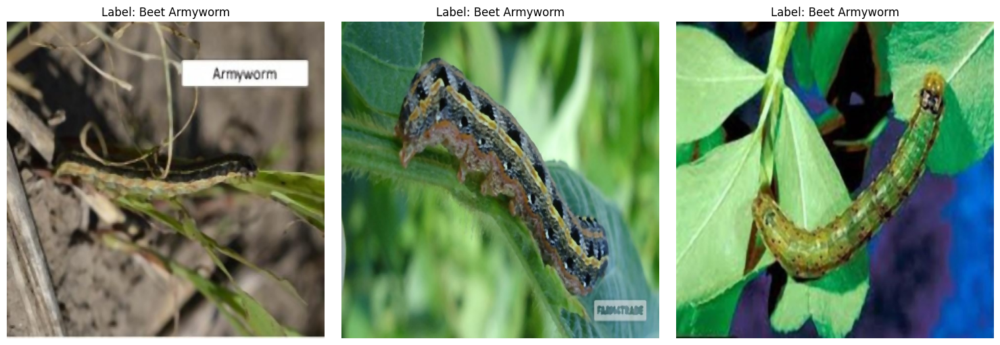

In [ ]:
# Google Colab: Mount Drive (only for copying original dataset)
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
MEDIAN_DATASET_DIR = '/content/jute_pest_dataset_median_filtered'  # Store median-filtered dataset locally
BASE_DIR = "/content/jute_pest_dataset"  # Local directory for original dataset

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply median filter (only to training images)
TRAIN_DIR = os.path.join(BASE_DIR, "train")
MEDIAN_TRAIN_DIR = os.path.join(MEDIAN_DATASET_DIR, "train")

os.makedirs(MEDIAN_TRAIN_DIR, exist_ok=True)

for class_name in os.listdir(TRAIN_DIR):
    class_dir = os.path.join(TRAIN_DIR, class_name)
    if os.path.isdir(class_dir):
        median_class_dir = os.path.join(MEDIAN_TRAIN_DIR, class_name)
        os.makedirs(median_class_dir, exist_ok=True)
        for img_name in os.listdir(class_dir):
            if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                img_path = os.path.join(class_dir, img_name)
                img = cv2.imread(img_path)
                median_img = cv2.medianBlur(img, 5)  # Apply median filter with kernel size 5
                cv2.imwrite(os.path.join(median_class_dir, img_name), median_img)

# Paths for validation and test datasets
VAL_DIR = os.path.join(BASE_DIR, "val")
TEST_DIR = os.path.join(BASE_DIR, "test")

assert os.path.exists(MEDIAN_TRAIN_DIR)
assert os.path.exists(VAL_DIR)
assert os.path.exists(TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase],
                        desc=f"Epoch {epoch+1} {phase.capitalize()}",
                        leave=False,
                        dynamic_ncols=True,
                        mininterval=1.0,
                        bar_format='{l_bar}{bar} | {n_fmt}/{total_fmt} [{elapsed}<{remaining}, {rate_fmt}]')
            for inputs, labels in pbar:
                inputs = inputs.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)
                optimizer.zero_grad(set_to_none=True)
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_best_jute_pest_model_median.pth"))
            pbar.close()
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main Code
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    # Transforms
    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(MEDIAN_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True,
                            persistent_workers=True, prefetch_factor=4),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True,
                          persistent_workers=True, prefetch_factor=4),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True,
                           persistent_workers=True, prefetch_factor=4)
    }

    # === AlexNet Model ===
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "final_jute_pest_model_median.pth"))

    # === Test Phase ===
    model.eval()
    test_results = []
    all_preds = []
    all_labels = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing", leave=False):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_test_results_median.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_confusion_matrix_median.png"))
    plt.show()

    # Show sample predictions from median filtered training dataset
    print("\n--- Sample Predictions from Median Filtered Training Dataset ---")
    median_train_dataset = JutePestDataset(MEDIAN_TRAIN_DIR, transform=data_transforms["train"])
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    for i, ax in enumerate(axes):
        img_path, label = median_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {median_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sample_predictions_median_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_training_logs_median.json"), "w") as f:
        json.dump(training_logs, f, indent=4)


# **Median Filter on val and test as well**

In [ ]:
# Google Colab: Mount Drive (only for copying original dataset)
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
MEDIAN_DATASET_DIR = '/content/jute_pest_dataset_median_filtered'  # Store median-filtered dataset locally
BASE_DIR = "/content/jute_pest_dataset"  # Local directory for original dataset

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply median filter (to training, validation, and test images)
TRAIN_DIR = os.path.join(BASE_DIR, "train")
VAL_DIR = os.path.join(BASE_DIR, "val")
TEST_DIR = os.path.join(BASE_DIR, "test")

# Directories for filtered datasets
MEDIAN_TRAIN_DIR = os.path.join(MEDIAN_DATASET_DIR, "train")
MEDIAN_VAL_DIR = os.path.join(MEDIAN_DATASET_DIR, "val")
MEDIAN_TEST_DIR = os.path.join(MEDIAN_DATASET_DIR, "test")

# Creating directories for filtered data
os.makedirs(MEDIAN_TRAIN_DIR, exist_ok=True)
os.makedirs(MEDIAN_VAL_DIR, exist_ok=True)
os.makedirs(MEDIAN_TEST_DIR, exist_ok=True)

# Apply median filter to training dataset
for class_name in os.listdir(TRAIN_DIR):
    class_dir = os.path.join(TRAIN_DIR, class_name)
    if os.path.isdir(class_dir):
        median_class_dir = os.path.join(MEDIAN_TRAIN_DIR, class_name)
        os.makedirs(median_class_dir, exist_ok=True)
        for img_name in os.listdir(class_dir):
            if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                img_path = os.path.join(class_dir, img_name)
                img = cv2.imread(img_path)
                median_img = cv2.medianBlur(img, 5)  # Apply median filter with kernel size 5
                cv2.imwrite(os.path.join(median_class_dir, img_name), median_img)

# Apply median filter to validation dataset
for class_name in os.listdir(VAL_DIR):
    class_dir = os.path.join(VAL_DIR, class_name)
    if os.path.isdir(class_dir):
        median_class_dir = os.path.join(MEDIAN_VAL_DIR, class_name)
        os.makedirs(median_class_dir, exist_ok=True)
        for img_name in os.listdir(class_dir):
            if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                img_path = os.path.join(class_dir, img_name)
                img = cv2.imread(img_path)
                median_img = cv2.medianBlur(img, 5)  # Apply median filter with kernel size 5
                cv2.imwrite(os.path.join(median_class_dir, img_name), median_img)

# Apply median filter to test dataset
for class_name in os.listdir(TEST_DIR):
    class_dir = os.path.join(TEST_DIR, class_name)
    if os.path.isdir(class_dir):
        median_class_dir = os.path.join(MEDIAN_TEST_DIR, class_name)
        os.makedirs(median_class_dir, exist_ok=True)
        for img_name in os.listdir(class_dir):
            if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                img_path = os.path.join(class_dir, img_name)
                img = cv2.imread(img_path)
                median_img = cv2.medianBlur(img, 5)  # Apply median filter with kernel size 5
                cv2.imwrite(os.path.join(median_class_dir, img_name), median_img)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase],
                        desc=f"Epoch {epoch+1} {phase.capitalize()}",
                        leave=False,
                        dynamic_ncols=True,
                        mininterval=1.0,
                        bar_format='{l_bar}{bar} | {n_fmt}/{total_fmt} [{elapsed}<{remaining}, {rate_fmt}]')
            for inputs, labels in pbar:
                inputs = inputs.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)
                optimizer.zero_grad(set_to_none=True)
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_best_jute_pest_model_median.pth"))
            pbar.close()
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main Code
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    # Transforms
    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(MEDIAN_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(MEDIAN_VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(MEDIAN_TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True,
                            persistent_workers=True, prefetch_factor=4),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True,
                          persistent_workers=True, prefetch_factor=4),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True,
                           persistent_workers=True, prefetch_factor=4)
    }

    # === AlexNet Model ===
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "final_jute_pest_model_median.pth"))

    # === Test Phase ===
    model.eval()
    test_results = []
    all_preds = []
    all_labels = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing", leave=False):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_test_results_median.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_confusion_matrix_median.png"))
    plt.show()

    # Show sample predictions from median filtered training dataset
    print("\n--- Sample Predictions from Median Filtered Training Dataset ---")
    median_train_dataset = JutePestDataset(MEDIAN_TRAIN_DIR, transform=data_transforms["train"])
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    for i, ax in enumerate(axes):
        img_path, label = median_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {median_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sample_predictions_median_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_train_logs_median.json"), "w") as f:
        json.dump(training_logs, f, indent=4)

    print("\n=== Finished ===")


# **Histogram Equalization**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Train 1:   0%|          | 0/101 [00:00<?, ?it/s]<ipython-input-4-e02d1f098709>:106: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: 1.2789  Acc: 0.6062


Val Loss: 1.2606  Acc: 0.6199

Epoch 2/10 ====================


Train Loss: 0.7641  Acc: 0.7624


Val Loss: 1.0533  Acc: 0.7215

Epoch 3/10 ====================


Train Loss: 0.5461  Acc: 0.8290


Val Loss: 0.9497  Acc: 0.7821

Epoch 4/10 ====================


Train Loss: 0.4420  Acc: 0.8661


Val Loss: 1.1644  Acc: 0.7264

Epoch 5/10 ====================


Train Loss: 0.2718  Acc: 0.9154


Val Loss: 0.9997  Acc: 0.7724

Epoch 6/10 ====================


Train Loss: 0.2253  Acc: 0.9302


Val Loss: 1.2047  Acc: 0.7797

Epoch 7/10 ====================


Train Loss: 0.1909  Acc: 0.9399


Val Loss: 1.4322  Acc: 0.6901

Epoch 8/10 ====================


Train Loss: 0.1482  Acc: 0.9544


Val Loss: 1.2256  Acc: 0.7627

Epoch 9/10 ====================


Train Loss: 0.2150  Acc: 0.9322


Val Loss: 1.2450  Acc: 0.7554

Epoch 10/10 ====================


Train Loss: 0.1688  Acc: 0.9477


Val Loss: 1.2168  Acc: 0.7337

Training complete in 5m 11s
Best validation accuracy: 0.7821


Testing: 100%|██████████| 6/6 [00:01<00:00,  3.27it/s]



--- Test Metrics ---
Test Accuracy : 0.7995
Precision     : 0.8508
Recall        : 0.7995
F1 Score      : 0.8018

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.70      0.35      0.47        20
                  Black Hairy       0.89      0.80      0.84        20
                      Cutworm       0.94      0.80      0.86        20
                Field Cricket       0.90      0.90      0.90        20
                   Jute Aphid       0.36      1.00      0.53        22
                   Jute Hairy       0.85      0.85      0.85        20
                Jute Red Mite       0.83      0.83      0.83        24
              Jute Semilooper       0.87      0.62      0.72        21
            Jute Stem Girdler       1.00      0.92      0.96        24
             Jute Stem Weevil       0.81      0.92      0.86        24
                  Leaf Beetle       1.00      1.00      1.00        24
         

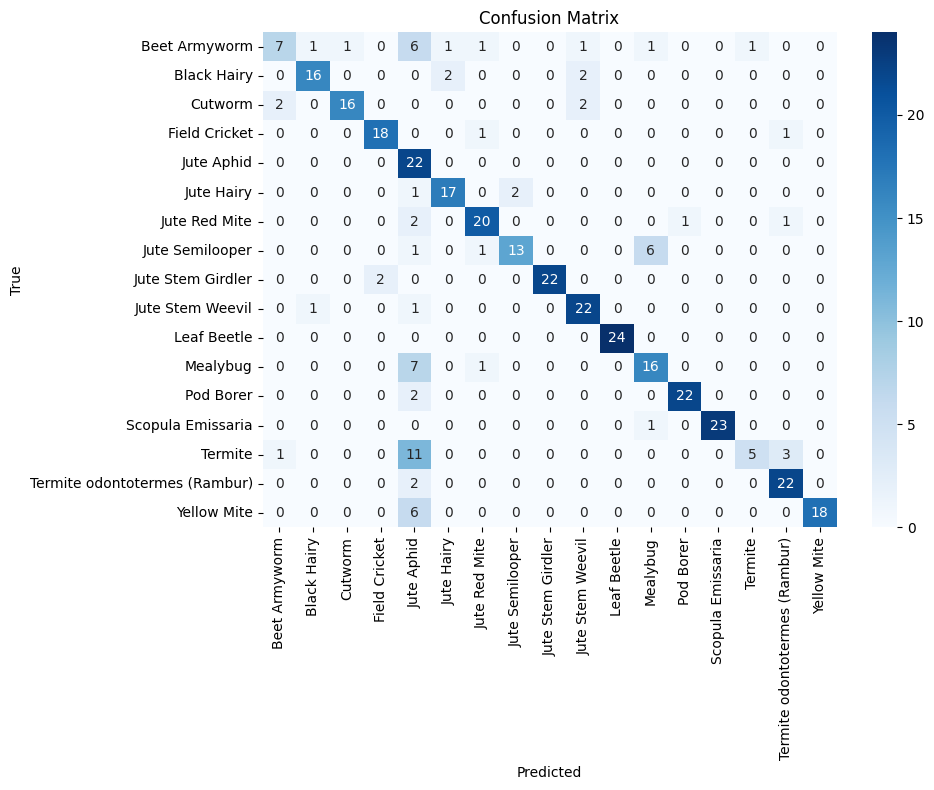


--- Sample Training Images After Histogram Equalization ---


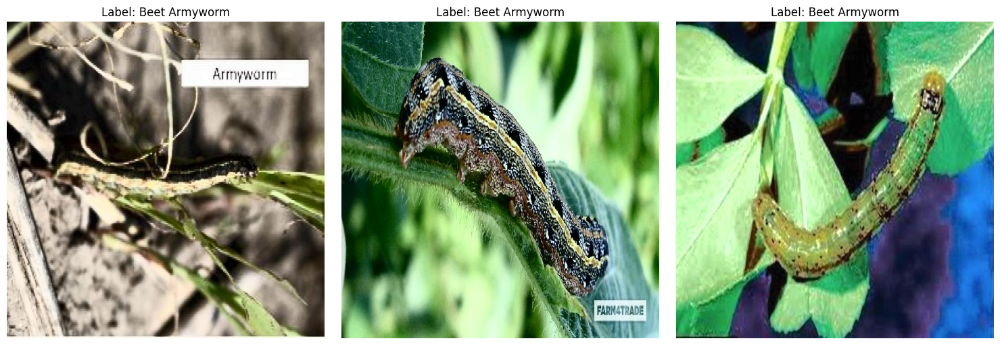

In [ ]:
# Google Colab: Mount Drive
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
HIST_EQ_DATASET_DIR = '/content/jute_pest_dataset_hist_eq'
BASE_DIR = '/content/jute_pest_dataset'

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply Histogram Equalization (only to training images)
TRAIN_DIR = os.path.join(BASE_DIR, "train")
HIST_EQ_TRAIN_DIR = os.path.join(HIST_EQ_DATASET_DIR, "train")
os.makedirs(HIST_EQ_TRAIN_DIR, exist_ok=True)

for class_name in os.listdir(TRAIN_DIR):
    class_dir = os.path.join(TRAIN_DIR, class_name)
    if os.path.isdir(class_dir):
        hist_eq_class_dir = os.path.join(HIST_EQ_TRAIN_DIR, class_name)
        os.makedirs(hist_eq_class_dir, exist_ok=True)
        for img_name in os.listdir(class_dir):
            if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                img_path = os.path.join(class_dir, img_name)
                img = cv2.imread(img_path)
                img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
                img_yuv[:, :, 0] = cv2.equalizeHist(img_yuv[:, :, 0])  # Equalize Y channel
                hist_eq_img = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)
                cv2.imwrite(os.path.join(hist_eq_class_dir, img_name), hist_eq_img)

# Paths for validation and test
VAL_DIR = os.path.join(BASE_DIR, "val")
TEST_DIR = os.path.join(BASE_DIR, "test")

assert os.path.exists(HIST_EQ_TRAIN_DIR)
assert os.path.exists(VAL_DIR)
assert os.path.exists(TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase], desc=f"{phase.capitalize()} {epoch+1}", leave=False)
            for inputs, labels in pbar:
                inputs = inputs.to(device)
                labels = labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_best_jute_pest_model_hist_eq.pth"))
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    # Transforms
    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(HIST_EQ_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True)
    }

    # Model: AlexNet
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "final_jute_pest_model_hist_eq.pth"))

    # Test
    model.eval()
    all_preds = []
    all_labels = []
    test_results = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing"):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_test_results_hist_eq.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_confusion_matrix_hist_eq.png"))
    plt.show()

    # Show sample predictions from HE training dataset
    print("\n--- Sample Training Images After Histogram Equalization ---")
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    he_train_dataset = JutePestDataset(HIST_EQ_TRAIN_DIR, transform=data_transforms["train"])
    for i, ax in enumerate(axes):
        img_path, label = he_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {he_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sample_hist_eq_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_training_logs_hist_eq.json"), "w") as f:
        json.dump(training_logs, f, indent=4)


# **Histogram Equalization on val and test as well**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Train 1:   0%|          | 0/101 [00:00<?, ?it/s]<ipython-input-7-a3336e039006>:114: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: 1.3305  Acc: 0.5930


Val Loss: 1.4128  Acc: 0.6320

Epoch 2/10 ====================


Train Loss: 0.8100  Acc: 0.7521


Val Loss: 1.3207  Acc: 0.6683

Epoch 3/10 ====================


Train Loss: 0.5422  Acc: 0.8310


Val Loss: 1.1007  Acc: 0.7143

Epoch 4/10 ====================


Train Loss: 0.3684  Acc: 0.8872


Val Loss: 0.9987  Acc: 0.7676

Epoch 5/10 ====================


Train Loss: 0.3006  Acc: 0.9063


Val Loss: 0.9185  Acc: 0.8015

Epoch 6/10 ====================


Train Loss: 0.2190  Acc: 0.9306


Val Loss: 1.1028  Acc: 0.7700

Epoch 7/10 ====================


Train Loss: 0.1782  Acc: 0.9460


Val Loss: 0.8852  Acc: 0.8015

Epoch 8/10 ====================


Train Loss: 0.1644  Acc: 0.9486


Val Loss: 0.8376  Acc: 0.7845

Epoch 9/10 ====================


Train Loss: 0.1634  Acc: 0.9513


Val Loss: 1.0332  Acc: 0.8087

Epoch 10/10 ====================


Train Loss: 0.1375  Acc: 0.9582


Val Loss: 0.9657  Acc: 0.7748

Training complete in 5m 8s
Best validation accuracy: 0.8087


Testing: 100%|██████████| 6/6 [00:02<00:00,  2.50it/s]



--- Test Metrics ---
Test Accuracy : 0.8417
Precision     : 0.8737
Recall        : 0.8417
F1 Score      : 0.8433

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.80      0.60      0.69        20
                  Black Hairy       0.95      1.00      0.98        20
                      Cutworm       0.94      0.75      0.83        20
                Field Cricket       1.00      0.90      0.95        20
                   Jute Aphid       0.71      0.68      0.70        22
                   Jute Hairy       1.00      0.80      0.89        20
                Jute Red Mite       0.79      0.92      0.85        24
              Jute Semilooper       0.92      0.57      0.71        21
            Jute Stem Girdler       1.00      0.83      0.91        24
             Jute Stem Weevil       0.96      0.92      0.94        24
                  Leaf Beetle       0.95      0.88      0.91        24
         

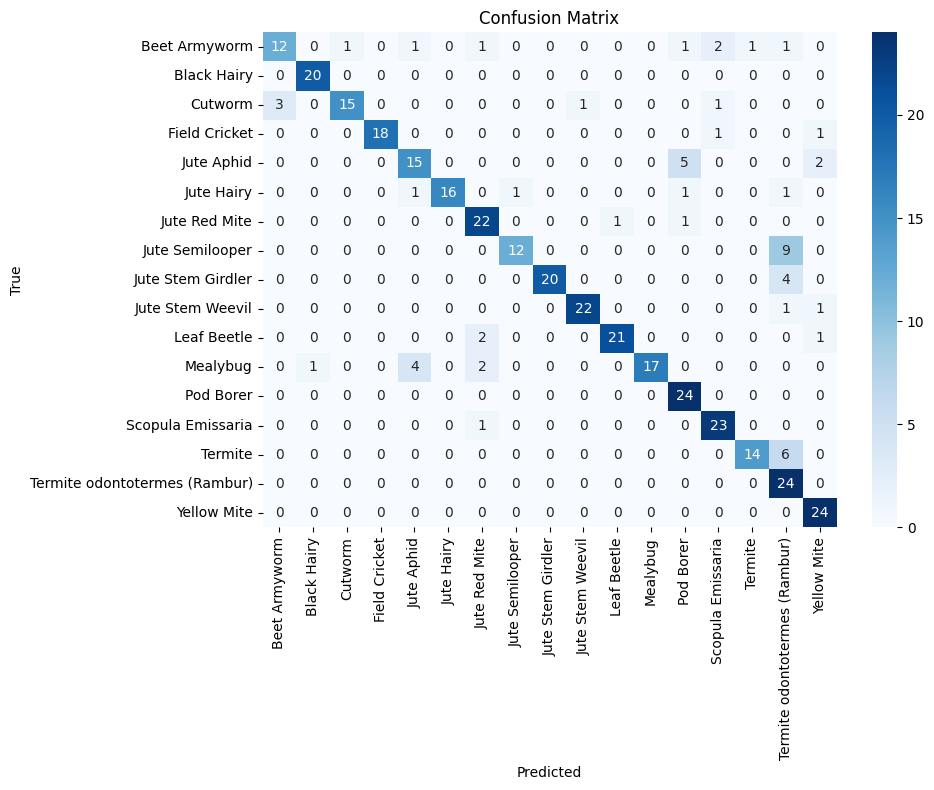


--- Sample Training Images After Histogram Equalization ---


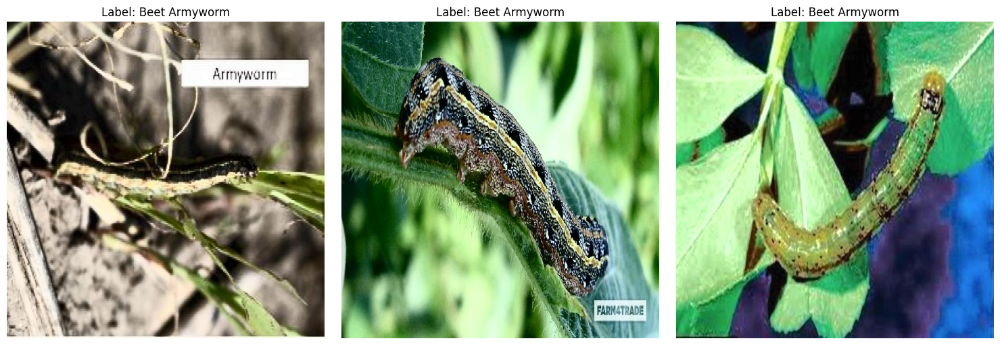

In [ ]:
# Google Colab: Mount Drive
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
HIST_EQ_DATASET_DIR = '/content/jute_pest_dataset_hist_eq'
BASE_DIR = '/content/jute_pest_dataset'

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply Histogram Equalization (to training, validation, and test images)
TRAIN_DIR = os.path.join(BASE_DIR, "train")
VAL_DIR = os.path.join(BASE_DIR, "val")
TEST_DIR = os.path.join(BASE_DIR, "test")

HIST_EQ_TRAIN_DIR = os.path.join(HIST_EQ_DATASET_DIR, "train")
HIST_EQ_VAL_DIR = os.path.join(HIST_EQ_DATASET_DIR, "val")
HIST_EQ_TEST_DIR = os.path.join(HIST_EQ_DATASET_DIR, "test")

# Create directories for processed images
os.makedirs(HIST_EQ_TRAIN_DIR, exist_ok=True)
os.makedirs(HIST_EQ_VAL_DIR, exist_ok=True)
os.makedirs(HIST_EQ_TEST_DIR, exist_ok=True)

# Function to apply histogram equalization
def apply_hist_eq(src_dir, dest_dir):
    for class_name in os.listdir(src_dir):
        class_dir = os.path.join(src_dir, class_name)
        if os.path.isdir(class_dir):
            hist_eq_class_dir = os.path.join(dest_dir, class_name)
            os.makedirs(hist_eq_class_dir, exist_ok=True)
            for img_name in os.listdir(class_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(class_dir, img_name)
                    img = cv2.imread(img_path)
                    img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
                    img_yuv[:, :, 0] = cv2.equalizeHist(img_yuv[:, :, 0])  # Equalize Y channel
                    hist_eq_img = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)
                    cv2.imwrite(os.path.join(hist_eq_class_dir, img_name), hist_eq_img)

# Apply histogram equalization to training, validation, and test sets
apply_hist_eq(TRAIN_DIR, HIST_EQ_TRAIN_DIR)
apply_hist_eq(VAL_DIR, HIST_EQ_VAL_DIR)
apply_hist_eq(TEST_DIR, HIST_EQ_TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase], desc=f"{phase.capitalize()} {epoch+1}", leave=False)
            for inputs, labels in pbar:
                inputs = inputs.to(device)
                labels = labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_best_jute_pest_model_hist_eq.pth"))
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    # Transforms
    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(HIST_EQ_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(HIST_EQ_VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(HIST_EQ_TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True)
    }

    # Model: AlexNet
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "final_jute_pest_model_hist_eq.pth"))

    # Test
    model.eval()
    all_preds = []
    all_labels = []
    test_results = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing"):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_test_results_hist_eq.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_confusion_matrix_hist_eq.png"))
    plt.show()

    # Show sample predictions from HE training dataset
    print("\n--- Sample Training Images After Histogram Equalization ---")
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    he_train_dataset = JutePestDataset(HIST_EQ_TRAIN_DIR, transform=data_transforms["train"])
    for i, ax in enumerate(axes):
        img_path, label = he_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {he_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sample_hist_eq_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_training_logs_hist_eq.json"), "w") as f:
        json.dump(training_logs, f, indent=4)


# **Adaptive Histogram Equalization**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Train 1:   0%|          | 0/101 [00:00<?, ?it/s]<ipython-input-5-436988f84e76>:104: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: 1.1231  Acc: 0.6581


Val Loss: 1.2955  Acc: 0.6247

Epoch 2/10 ====================


Train Loss: 0.5485  Acc: 0.8246


Val Loss: 1.3963  Acc: 0.6828

Epoch 3/10 ====================


Train Loss: 0.3946  Acc: 0.8760


Val Loss: 0.9335  Acc: 0.7240

Epoch 4/10 ====================


Train Loss: 0.2506  Acc: 0.9216


Val Loss: 1.2417  Acc: 0.7191

Epoch 5/10 ====================


Train Loss: 0.2291  Acc: 0.9274


Val Loss: 1.1664  Acc: 0.7094

Epoch 6/10 ====================


Train Loss: 0.1568  Acc: 0.9503


Val Loss: 1.0776  Acc: 0.7409

Epoch 7/10 ====================


Train Loss: 0.1261  Acc: 0.9620


Val Loss: 1.0786  Acc: 0.7748

Epoch 8/10 ====================


Train Loss: 0.1208  Acc: 0.9623


Val Loss: 1.2698  Acc: 0.7361

Epoch 9/10 ====================


Train Loss: 0.1052  Acc: 0.9677


Val Loss: 1.0664  Acc: 0.7821

Epoch 10/10 ====================


Train Loss: 0.0931  Acc: 0.9704


Val Loss: 1.3541  Acc: 0.7433

Training complete in 5m 59s
Best validation accuracy: 0.7821


Testing: 100%|██████████| 6/6 [00:01<00:00,  3.17it/s]



--- Test Metrics ---
Test Accuracy : 0.7678
Precision     : 0.8277
Recall        : 0.7678
F1 Score      : 0.7655

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.67      0.40      0.50        20
                  Black Hairy       1.00      0.85      0.92        20
                      Cutworm       0.87      0.65      0.74        20
                Field Cricket       1.00      0.90      0.95        20
                   Jute Aphid       0.36      1.00      0.53        22
                   Jute Hairy       0.58      0.75      0.65        20
                Jute Red Mite       0.71      0.92      0.80        24
              Jute Semilooper       0.77      0.48      0.59        21
            Jute Stem Girdler       1.00      1.00      1.00        24
             Jute Stem Weevil       0.88      0.88      0.88        24
                  Leaf Beetle       1.00      1.00      1.00        24
         

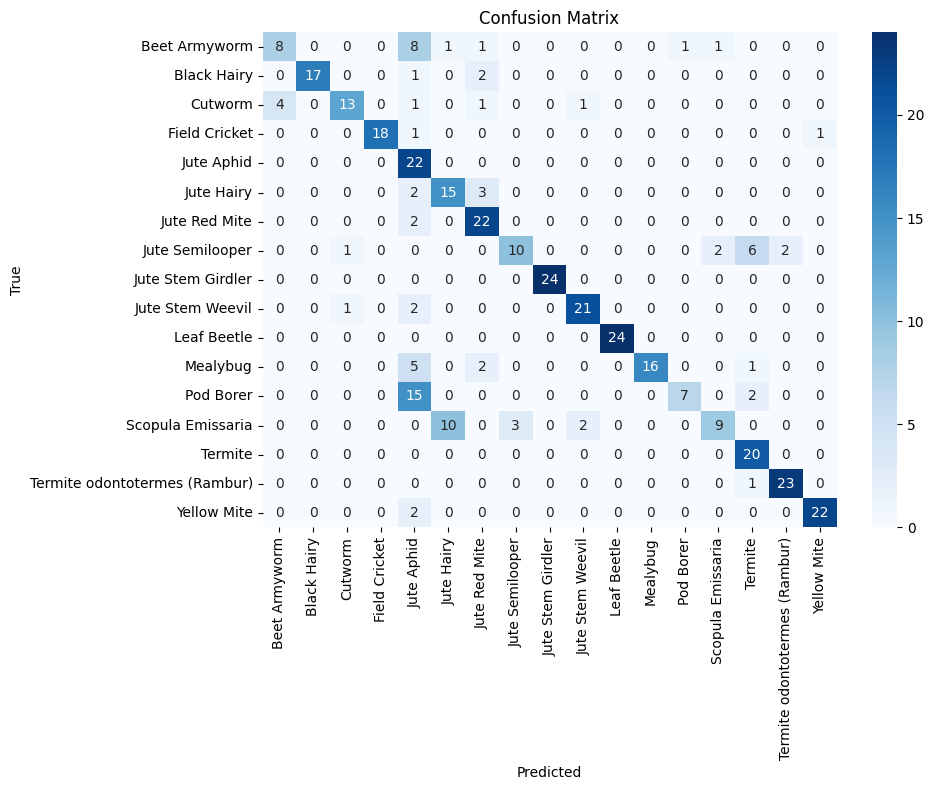


--- Sample Training Images After CLAHE ---


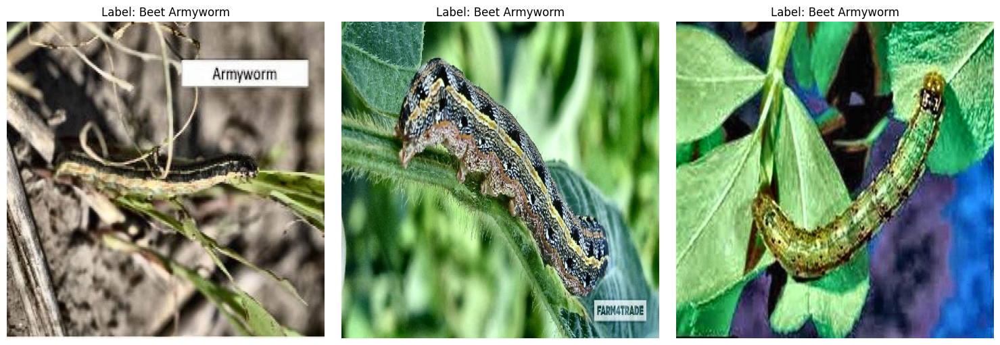

In [ ]:
# Google Colab: Mount Drive
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, classification_report, confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
CLAHE_DATASET_DIR = '/content/jute_pest_dataset_clahe'
BASE_DIR = '/content/jute_pest_dataset'

# Copy original dataset
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply CLAHE to training images
TRAIN_DIR = os.path.join(BASE_DIR, "train")
CLAHE_TRAIN_DIR = os.path.join(CLAHE_DATASET_DIR, "train")
os.makedirs(CLAHE_TRAIN_DIR, exist_ok=True)

clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

for class_name in os.listdir(TRAIN_DIR):
    class_dir = os.path.join(TRAIN_DIR, class_name)
    if os.path.isdir(class_dir):
        clahe_class_dir = os.path.join(CLAHE_TRAIN_DIR, class_name)
        os.makedirs(clahe_class_dir, exist_ok=True)
        for img_name in os.listdir(class_dir):
            if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                img_path = os.path.join(class_dir, img_name)
                img = cv2.imread(img_path)
                img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
                img_yuv[:, :, 0] = clahe.apply(img_yuv[:, :, 0])  # CLAHE on luminance
                clahe_img = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)
                cv2.imwrite(os.path.join(clahe_class_dir, img_name), clahe_img)

# Set validation and test dirs (unaltered)
VAL_DIR = os.path.join(BASE_DIR, "val")
TEST_DIR = os.path.join(BASE_DIR, "test")

assert os.path.exists(CLAHE_TRAIN_DIR)
assert os.path.exists(VAL_DIR)
assert os.path.exists(TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase], desc=f"{phase.capitalize()} {epoch+1}", leave=False)
            for inputs, labels in pbar:
                inputs = inputs.to(device)
                labels = labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_best_jute_pest_model_clahe.pth"))
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    # Transforms
    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(CLAHE_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True)
    }

    # AlexNet
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "final_jute_pest_model_clahe.pth"))

    # Test
    model.eval()
    all_preds = []
    all_labels = []
    test_results = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing"):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_test_results_clahe.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_confusion_matrix_clahe.png"))
    plt.show()

    # Show sample CLAHE-processed training images
    print("\n--- Sample Training Images After CLAHE ---")
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    clahe_train_dataset = JutePestDataset(CLAHE_TRAIN_DIR, transform=data_transforms["train"])
    for i, ax in enumerate(axes):
        img_path, label = clahe_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {clahe_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sample_clahe_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_training_logs_clahe.json"), "w") as f:
        json.dump(training_logs, f, indent=4)


# **Adaptive Histogram Equalization on val and test as well**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Train 1:   0%|          | 0/101 [00:00<?, ?it/s]<ipython-input-8-7683218c24e4>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: 1.1415  Acc: 0.6606


Val Loss: 1.1753  Acc: 0.6925

Epoch 2/10 ====================


Train Loss: 0.5667  Acc: 0.8290


Val Loss: 1.0881  Acc: 0.7312

Epoch 3/10 ====================


Train Loss: 0.3678  Acc: 0.8856


Val Loss: 0.7822  Acc: 0.7942

Epoch 4/10 ====================


Train Loss: 0.2663  Acc: 0.9173


Val Loss: 0.9779  Acc: 0.7918

Epoch 5/10 ====================


Train Loss: 0.2291  Acc: 0.9331


Val Loss: 0.9583  Acc: 0.7869

Epoch 6/10 ====================


Train Loss: 0.1980  Acc: 0.9388


Val Loss: 0.7396  Acc: 0.8547

Epoch 7/10 ====================


Train Loss: 0.1456  Acc: 0.9520


Val Loss: 0.9549  Acc: 0.7893

Epoch 8/10 ====================


Train Loss: 0.1149  Acc: 0.9637


Val Loss: 0.8366  Acc: 0.8378

Epoch 9/10 ====================


Train Loss: 0.1360  Acc: 0.9582


Val Loss: 0.8077  Acc: 0.8232

Epoch 10/10 ====================


Train Loss: 0.0879  Acc: 0.9724


Val Loss: 0.9694  Acc: 0.8378

Training complete in 5m 23s
Best validation accuracy: 0.8547


Testing: 100%|██████████| 6/6 [00:02<00:00,  2.65it/s]



--- Test Metrics ---
Test Accuracy : 0.9604
Precision     : 0.9666
Recall        : 0.9604
F1 Score      : 0.9609

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       1.00      0.75      0.86        20
                  Black Hairy       1.00      1.00      1.00        20
                      Cutworm       0.95      0.95      0.95        20
                Field Cricket       1.00      1.00      1.00        20
                   Jute Aphid       0.73      1.00      0.85        22
                   Jute Hairy       0.91      1.00      0.95        20
                Jute Red Mite       1.00      0.88      0.93        24
              Jute Semilooper       1.00      0.95      0.98        21
            Jute Stem Girdler       1.00      1.00      1.00        24
             Jute Stem Weevil       1.00      1.00      1.00        24
                  Leaf Beetle       1.00      1.00      1.00        24
         

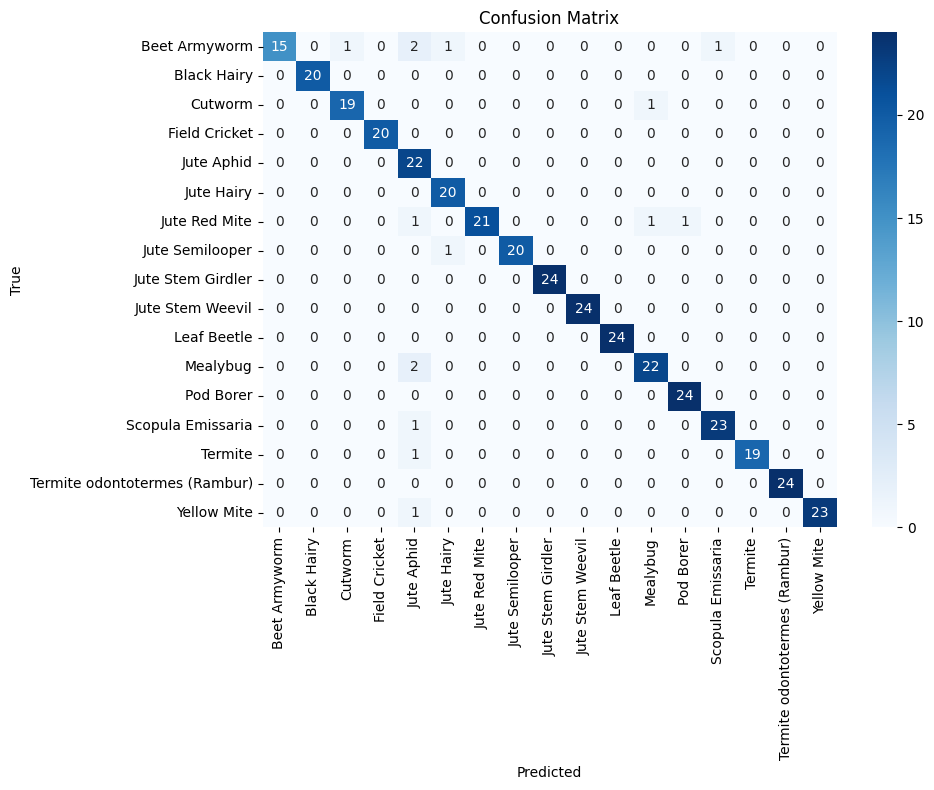


--- Sample Training Images After CLAHE ---


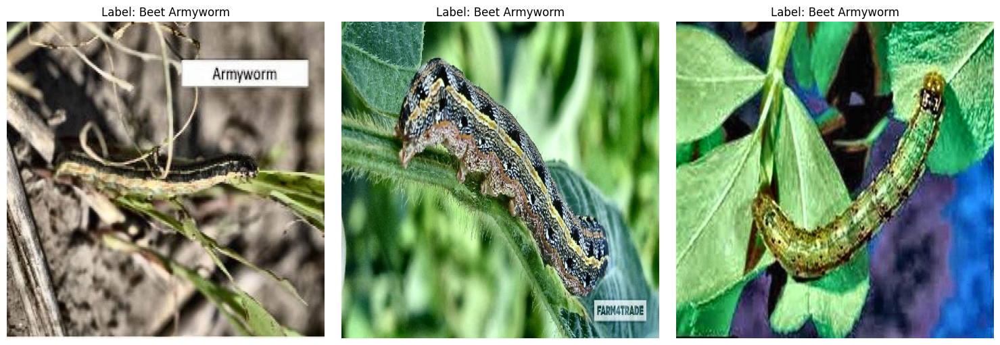

In [ ]:
# Google Colab: Mount Drive
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, classification_report, confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
CLAHE_DATASET_DIR = '/content/jute_pest_dataset_clahe'
BASE_DIR = '/content/jute_pest_dataset'

# Copy original dataset
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply CLAHE to training images
TRAIN_DIR = os.path.join(BASE_DIR, "train")
CLAHE_TRAIN_DIR = os.path.join(CLAHE_DATASET_DIR, "train")
os.makedirs(CLAHE_TRAIN_DIR, exist_ok=True)

clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

for class_name in os.listdir(TRAIN_DIR):
    class_dir = os.path.join(TRAIN_DIR, class_name)
    if os.path.isdir(class_dir):
        clahe_class_dir = os.path.join(CLAHE_TRAIN_DIR, class_name)
        os.makedirs(clahe_class_dir, exist_ok=True)
        for img_name in os.listdir(class_dir):
            if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                img_path = os.path.join(class_dir, img_name)
                img = cv2.imread(img_path)
                img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
                img_yuv[:, :, 0] = clahe.apply(img_yuv[:, :, 0])  # CLAHE on luminance
                clahe_img = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)
                cv2.imwrite(os.path.join(clahe_class_dir, img_name), clahe_img)

# Apply CLAHE to validation images
VAL_DIR = os.path.join(BASE_DIR, "val")
CLAHE_VAL_DIR = os.path.join(CLAHE_DATASET_DIR, "val")
os.makedirs(CLAHE_VAL_DIR, exist_ok=True)

for class_name in os.listdir(VAL_DIR):
    class_dir = os.path.join(VAL_DIR, class_name)
    if os.path.isdir(class_dir):
        clahe_class_dir = os.path.join(CLAHE_VAL_DIR, class_name)
        os.makedirs(clahe_class_dir, exist_ok=True)
        for img_name in os.listdir(class_dir):
            if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                img_path = os.path.join(class_dir, img_name)
                img = cv2.imread(img_path)
                img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
                img_yuv[:, :, 0] = clahe.apply(img_yuv[:, :, 0])  # CLAHE on luminance
                clahe_img = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)
                cv2.imwrite(os.path.join(clahe_class_dir, img_name), clahe_img)

# Apply CLAHE to test images
TEST_DIR = os.path.join(BASE_DIR, "test")
CLAHE_TEST_DIR = os.path.join(CLAHE_DATASET_DIR, "test")
os.makedirs(CLAHE_TEST_DIR, exist_ok=True)

for class_name in os.listdir(TEST_DIR):
    class_dir = os.path.join(TEST_DIR, class_name)
    if os.path.isdir(class_dir):
        clahe_class_dir = os.path.join(CLAHE_TEST_DIR, class_name)
        os.makedirs(clahe_class_dir, exist_ok=True)
        for img_name in os.listdir(class_dir):
            if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                img_path = os.path.join(class_dir, img_name)
                img = cv2.imread(img_path)
                img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
                img_yuv[:, :, 0] = clahe.apply(img_yuv[:, :, 0])  # CLAHE on luminance
                clahe_img = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)
                cv2.imwrite(os.path.join(clahe_class_dir, img_name), clahe_img)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase], desc=f"{phase.capitalize()} {epoch+1}", leave=False)
            for inputs, labels in pbar:
                inputs = inputs.to(device)
                labels = labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_best_jute_pest_model_clahe.pth"))
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    # Transforms
    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(CLAHE_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(CLAHE_VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(CLAHE_TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True)
    }

    # AlexNet
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "final_jute_pest_model_clahe.pth"))

    # Test
    model.eval()
    all_preds = []
    all_labels = []
    test_results = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing"):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_test_results_clahe.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_confusion_matrix_clahe.png"))
    plt.show()

    # Show sample CLAHE-processed training images
    print("\n--- Sample Training Images After CLAHE ---")
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    clahe_train_dataset = JutePestDataset(CLAHE_TRAIN_DIR, transform=data_transforms["train"])
    for i, ax in enumerate(axes):
        img_path, label = clahe_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {clahe_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sample_clahe_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_training_logs_clahe.json"), "w") as f:
        json.dump(training_logs, f, indent=4)


# **Sobel Edge Detection**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Epoch 1 Train:   0%|           | 0/101 [00:00<?, ?it/s]<ipython-input-9-faa6d4a7a472>:118: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: 1.9412  Acc: 0.3858


Val Loss: 1.9843  Acc: 0.3801

Epoch 2/10 ====================


Train Loss: 1.2907  Acc: 0.5819


Val Loss: 1.6858  Acc: 0.5400

Epoch 3/10 ====================


Train Loss: 0.9672  Acc: 0.6863


Val Loss: 1.5750  Acc: 0.6029

Epoch 4/10 ====================


Train Loss: 0.7610  Acc: 0.7613


Val Loss: 1.6829  Acc: 0.5714

Epoch 5/10 ====================


Train Loss: 0.6064  Acc: 0.8054


Val Loss: 1.6054  Acc: 0.6320

Epoch 6/10 ====================


Train Loss: 0.5210  Acc: 0.8342


Val Loss: 1.3893  Acc: 0.6320

Epoch 7/10 ====================


Train Loss: 0.4109  Acc: 0.8614


Val Loss: 1.7431  Acc: 0.6150

Epoch 8/10 ====================


Train Loss: 0.3763  Acc: 0.8771


Val Loss: 1.3803  Acc: 0.6538

Epoch 9/10 ====================


Train Loss: 0.3487  Acc: 0.8859


Val Loss: 1.4454  Acc: 0.6416

Epoch 10/10 ====================


Train Loss: 0.3076  Acc: 0.8988


Val Loss: 1.5022  Acc: 0.6683

Training complete in 5m 1s
Best validation accuracy: 0.6683



--- Test Metrics ---
Test Accuracy : 0.7836
Precision     : 0.7877
Recall        : 0.7836
F1 Score      : 0.7745

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.77      0.50      0.61        20
                  Black Hairy       0.90      0.95      0.93        20
                      Cutworm       0.64      0.90      0.75        20
                Field Cricket       1.00      0.95      0.97        20
                   Jute Aphid       0.27      0.32      0.29        22
                   Jute Hairy       0.89      0.85      0.87        20
                Jute Red Mite       0.75      0.50      0.60        24
              Jute Semilooper       0.50      0.19      0.28        21
            Jute Stem Girdler       1.00      0.96      0.98        24
             Jute Stem Weevil       0.86      0.79      0.83        24
                  Leaf Beetle       0.88      0.96      0.92        24
         

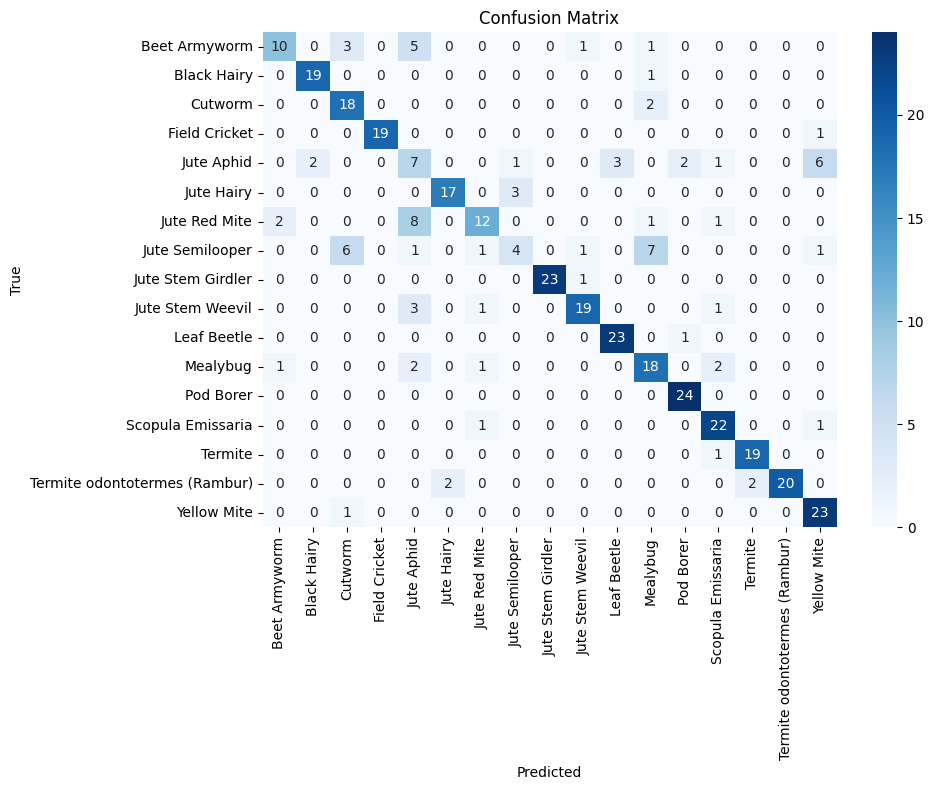


--- Sample Predictions from Sobel Processed Training Dataset ---


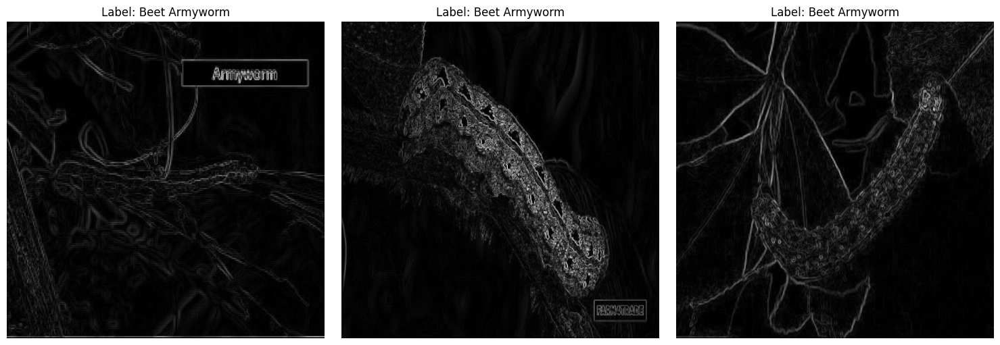

In [ ]:
# Google Colab: Mount Drive (only for copying original dataset)
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
SOBEL_DATASET_DIR = '/content/jute_pest_dataset_sobel'  # Store Sobel dataset locally in Colab
BASE_DIR = "/content/jute_pest_dataset"  # Local directory for original dataset

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply Sobel Edge Detection to training images
TRAIN_DIR = os.path.join(BASE_DIR, "train")
SOBEL_TRAIN_DIR = os.path.join(SOBEL_DATASET_DIR, "train")
SOBEL_VAL_DIR = os.path.join(SOBEL_DATASET_DIR, "val")
SOBEL_TEST_DIR = os.path.join(SOBEL_DATASET_DIR, "test")

os.makedirs(SOBEL_TRAIN_DIR, exist_ok=True)
os.makedirs(SOBEL_VAL_DIR, exist_ok=True)
os.makedirs(SOBEL_TEST_DIR, exist_ok=True)

def apply_sobel_edge_detection(source_dir, dest_dir):
    for class_name in os.listdir(source_dir):
        class_dir = os.path.join(source_dir, class_name)
        if os.path.isdir(class_dir):
            sobel_class_dir = os.path.join(dest_dir, class_name)
            os.makedirs(sobel_class_dir, exist_ok=True)
            for img_name in os.listdir(class_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(class_dir, img_name)
                    img = cv2.imread(img_path)
                    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
                    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
                    sobel_combined = cv2.magnitude(sobelx, sobely)
                    sobel_combined = cv2.normalize(sobel_combined, None, 0, 255, cv2.NORM_MINMAX)
                    sobel_combined = sobel_combined.astype("uint8")
                    sobel_3ch = cv2.merge([sobel_combined] * 3)
                    cv2.imwrite(os.path.join(sobel_class_dir, img_name), sobel_3ch)

# Apply Sobel to training, validation, and test datasets
apply_sobel_edge_detection(TRAIN_DIR, SOBEL_TRAIN_DIR)
apply_sobel_edge_detection(VAL_DIR, SOBEL_VAL_DIR)
apply_sobel_edge_detection(TEST_DIR, SOBEL_TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase],
                        desc=f"Epoch {epoch+1} {phase.capitalize()}",
                        leave=False,
                        dynamic_ncols=True,
                        mininterval=1.0,
                        bar_format='{l_bar}{bar} | {n_fmt}/{total_fmt} [{elapsed}<{remaining}, {rate_fmt}]')
            for inputs, labels in pbar:
                inputs = inputs.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)
                optimizer.zero_grad(set_to_none=True)
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_sobel_best_jute_pest_model.pth"))
            pbar.close()
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main Code
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(SOBEL_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(SOBEL_VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(SOBEL_TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True,
                            persistent_workers=True, prefetch_factor=4),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True,
                          persistent_workers=True, prefetch_factor=4),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True,
                           persistent_workers=True, prefetch_factor=4)
    }

    # === AlexNet Model ===
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_sobel_final_jute_pest_model.pth"))

    # === Test Phase ===
    model.eval()
    test_results = []
    all_preds = []
    all_labels = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing", leave=False):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_sobel_test_results.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    # Metrics
    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sobel_confusion_matrix.png"))
    plt.show()

    print("\n--- Sample Predictions from Sobel Processed Training Dataset ---")
    sobel_train_dataset = JutePestDataset(SOBEL_TRAIN_DIR, transform=data_transforms["train"])
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    for i, ax in enumerate(axes):
        img_path, label = sobel_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {sobel_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sobel_sample_predictions_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_sobel_training_logs.json"), "w") as f:
        json.dump(training_logs, f, indent=4)


# **sharpening kernel Gray**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Epoch 1 Train:   0%|           | 0/101 [00:00<?, ?it/s]<ipython-input-11-48777cb5108e>:129: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: 1.4802  Acc: 0.5471


Val Loss: 1.2861  Acc: 0.6634

Epoch 2/10 ====================


Train Loss: 0.8828  Acc: 0.7219


Val Loss: 1.0269  Acc: 0.7191

Epoch 3/10 ====================


Train Loss: 0.6268  Acc: 0.8055


Val Loss: 1.3068  Acc: 0.6562

Epoch 4/10 ====================


Train Loss: 0.5401  Acc: 0.8296


Val Loss: 1.0520  Acc: 0.7094

Epoch 5/10 ====================


Train Loss: 0.3302  Acc: 0.8969


Val Loss: 1.1997  Acc: 0.7458

Epoch 6/10 ====================


Train Loss: 0.2753  Acc: 0.9117


Val Loss: 1.1444  Acc: 0.7772

Epoch 7/10 ====================


Train Loss: 0.2464  Acc: 0.9222


Val Loss: 1.3160  Acc: 0.7385

Epoch 8/10 ====================


Train Loss: 0.2060  Acc: 0.9364


Val Loss: 1.0142  Acc: 0.7482

Epoch 9/10 ====================


Train Loss: 0.1874  Acc: 0.9420


Val Loss: 1.0746  Acc: 0.7869

Epoch 10/10 ====================


Train Loss: 0.1744  Acc: 0.9458


Val Loss: 1.2647  Acc: 0.7288

Training complete in 5m 12s
Best validation accuracy: 0.7869



--- Test Metrics ---
Test Accuracy : 0.8681
Precision     : 0.8720
Recall        : 0.8681
F1 Score      : 0.8553

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.55      0.80      0.65        20
                  Black Hairy       1.00      1.00      1.00        20
                      Cutworm       0.77      0.85      0.81        20
                Field Cricket       1.00      1.00      1.00        20
                   Jute Aphid       0.77      0.45      0.57        22
                   Jute Hairy       1.00      0.90      0.95        20
                Jute Red Mite       0.83      0.62      0.71        24
              Jute Semilooper       0.67      0.19      0.30        21
            Jute Stem Girdler       1.00      1.00      1.00        24
             Jute Stem Weevil       0.82      0.96      0.88        24
                  Leaf Beetle       0.96      1.00      0.98        24
         

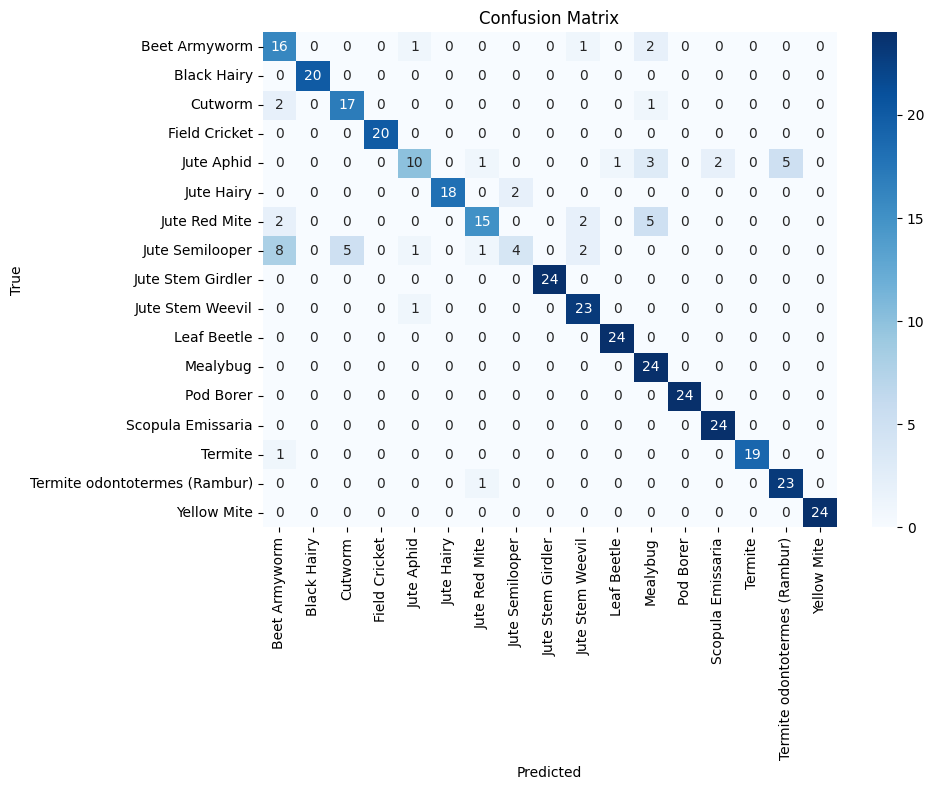


--- Sample Predictions from Sharpened Processed Training Dataset ---


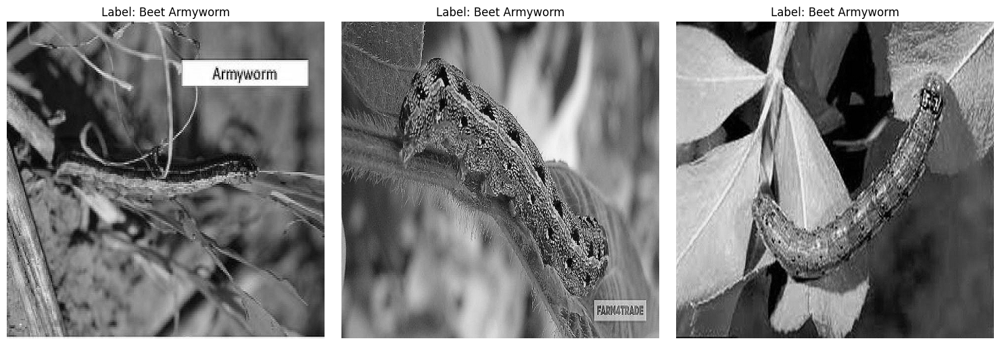

In [ ]:
# Google Colab: Mount Drive (only for copying original dataset)
from google.colab import drive
drive.mount('/content/drive')
import os
import numpy as np
import cv2
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
SHARPENED_DATASET_DIR = '/content/jute_pest_dataset_sharpened'  # Store Sharpened dataset locally in Colab
BASE_DIR = "/content/jute_pest_dataset"  # Local directory for original dataset

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply First-Order Sharpening to training images
TRAIN_DIR = os.path.join(BASE_DIR, "train")
SHARPENED_TRAIN_DIR = os.path.join(SHARPENED_DATASET_DIR, "train")
SHARPENED_VAL_DIR = os.path.join(SHARPENED_DATASET_DIR, "val")
SHARPENED_TEST_DIR = os.path.join(SHARPENED_DATASET_DIR, "test")

os.makedirs(SHARPENED_TRAIN_DIR, exist_ok=True)
os.makedirs(SHARPENED_VAL_DIR, exist_ok=True)
os.makedirs(SHARPENED_TEST_DIR, exist_ok=True)

def apply_first_order_sharpening(source_dir, dest_dir):
    # Define the sharpening kernel
    sharpening_kernel = np.array([[0, -1, 0],
                                  [-1, 5, -1],
                                  [0, -1, 0]], dtype=np.float32)

    for class_name in os.listdir(source_dir):
        class_dir = os.path.join(source_dir, class_name)
        if os.path.isdir(class_dir):
            sharpened_class_dir = os.path.join(dest_dir, class_name)
            os.makedirs(sharpened_class_dir, exist_ok=True)
            for img_name in os.listdir(class_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(class_dir, img_name)
                    img = cv2.imread(img_path)
                    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

                    # Apply the sharpening kernel
                    sharpened = cv2.filter2D(gray, -1, sharpening_kernel)

                    # Normalize the sharpened image to ensure pixel values are within [0, 255]
                    sharpened = cv2.normalize(sharpened, None, 0, 255, cv2.NORM_MINMAX)
                    sharpened = sharpened.astype("uint8")

                    # Convert back to 3-channel image
                    sharpened_3ch = cv2.merge([sharpened] * 3)

                    # Save the sharpened image
                    cv2.imwrite(os.path.join(sharpened_class_dir, img_name), sharpened_3ch)

# Apply Sharpening to training, validation, and test datasets
apply_first_order_sharpening(TRAIN_DIR, SHARPENED_TRAIN_DIR)
apply_first_order_sharpening(VAL_DIR, SHARPENED_VAL_DIR)
apply_first_order_sharpening(TEST_DIR, SHARPENED_TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase],
                        desc=f"Epoch {epoch+1} {phase.capitalize()}",
                        leave=False,
                        dynamic_ncols=True,
                        mininterval=1.0,
                        bar_format='{l_bar}{bar} | {n_fmt}/{total_fmt} [{elapsed}<{remaining}, {rate_fmt}]')
            for inputs, labels in pbar:
                inputs = inputs.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)
                optimizer.zero_grad(set_to_none=True)
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_sharpened_best_jute_pest_model.pth"))
            pbar.close()
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main Code
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(SHARPENED_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(SHARPENED_VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(SHARPENED_TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True,
                            persistent_workers=True, prefetch_factor=4),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True,
                          persistent_workers=True, prefetch_factor=4),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True,
                           persistent_workers=True, prefetch_factor=4)
    }

    # === AlexNet Model ===
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)
    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )
    torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_sharpened_final_jute_pest_model.pth"))

    # === Test Phase ===
    model.eval()
    test_results = []
    all_preds = []
    all_labels = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing", leave=False):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_sharpened_test_results.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    # Metrics
    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sharpened_confusion_matrix.png"))
    plt.show()

    print("\n--- Sample Predictions from Sharpened Processed Training Dataset ---")
    sharpened_train_dataset = JutePestDataset(SHARPENED_TRAIN_DIR, transform=data_transforms["train"])
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    for i, ax in enumerate(axes):
        img_path, label = sharpened_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {sharpened_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sharpened_sample_predictions_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_sharpened_training_logs.json"), "w") as f:
        json.dump(training_logs, f, indent=4)

# **Sharpening RGB**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Epoch 1 Train:   0%|           | 0/101 [00:00<?, ?it/s]<ipython-input-12-3651936e9a26>:121: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: 1.2870  Acc: 0.6177


Val Loss: 1.1670  Acc: 0.6731

Epoch 2/10 ====================


Train Loss: 0.6336  Acc: 0.8055


Val Loss: 1.0165  Acc: 0.7845

Epoch 3/10 ====================


Train Loss: 0.4129  Acc: 0.8758


Val Loss: 0.9247  Acc: 0.7772

Epoch 4/10 ====================


Train Loss: 0.3317  Acc: 0.8994


Val Loss: 0.8727  Acc: 0.7893

Epoch 5/10 ====================


Train Loss: 0.2663  Acc: 0.9176


Val Loss: 0.9008  Acc: 0.8087

Epoch 6/10 ====================


Train Loss: 0.1935  Acc: 0.9420


Val Loss: 0.9031  Acc: 0.8281

Epoch 7/10 ====================


Train Loss: 0.1465  Acc: 0.9541


Val Loss: 0.8269  Acc: 0.8329

Epoch 8/10 ====================


Train Loss: 0.1580  Acc: 0.9534


Val Loss: 1.2382  Acc: 0.8015

Epoch 9/10 ====================


Train Loss: 0.1129  Acc: 0.9648


Val Loss: 0.9799  Acc: 0.8692

Epoch 10/10 ====================


Train Loss: 0.1030  Acc: 0.9711


Val Loss: 1.0224  Acc: 0.8426

Training complete in 6m 10s
Best validation accuracy: 0.8692



--- Test Metrics ---
Test Accuracy : 0.8918
Precision     : 0.9044
Recall        : 0.8918
F1 Score      : 0.8903

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.59      0.80      0.68        20
                  Black Hairy       0.95      1.00      0.98        20
                      Cutworm       0.93      0.65      0.76        20
                Field Cricket       1.00      0.90      0.95        20
                   Jute Aphid       0.73      1.00      0.85        22
                   Jute Hairy       0.86      0.90      0.88        20
                Jute Red Mite       0.83      0.83      0.83        24
              Jute Semilooper       0.92      0.52      0.67        21
            Jute Stem Girdler       1.00      1.00      1.00        24
             Jute Stem Weevil       1.00      1.00      1.00        24
                  Leaf Beetle       0.96      1.00      0.98        24
         

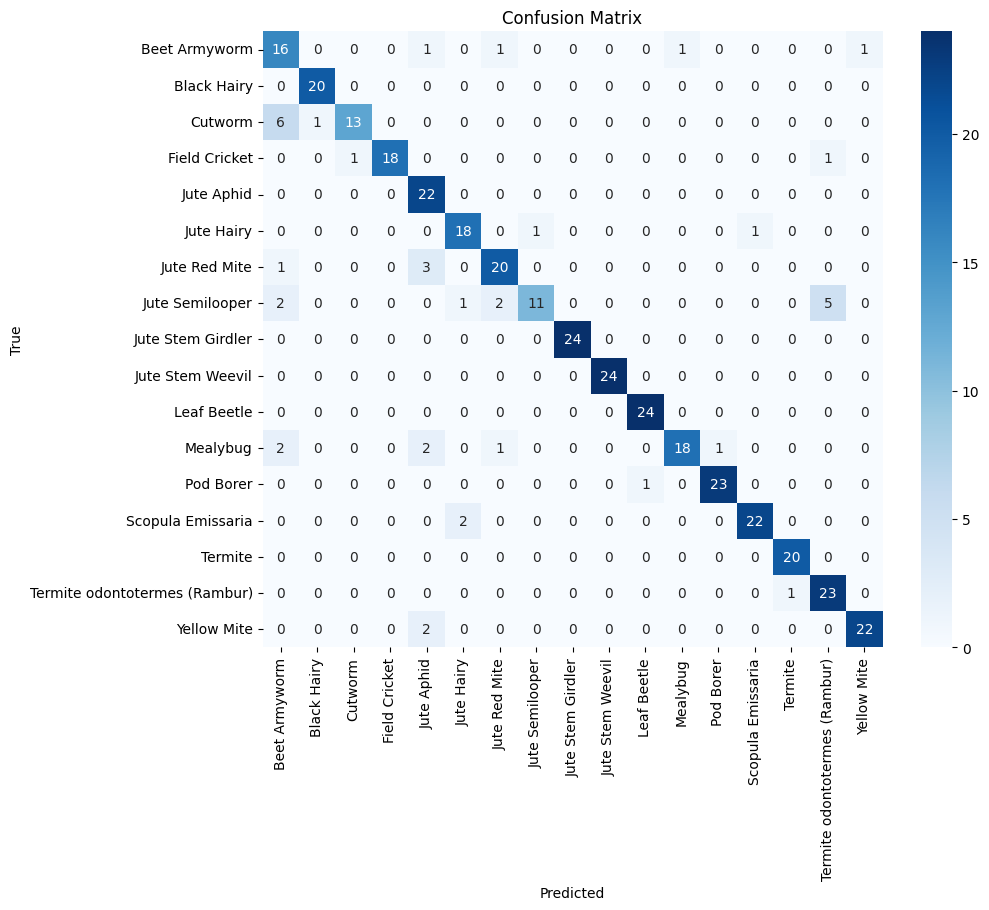

In [ ]:
# Google Colab: Mount Drive (only for copying original dataset)
from google.colab import drive
drive.mount('/content/drive')
import os
import numpy as np
import cv2
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
SHARPENED_DATASET_DIR = '/content/jute_pest_dataset_sharpened'  # Store Sharpened dataset locally in Colab
BASE_DIR = "/content/jute_pest_dataset"  # Local directory for original dataset

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply First-Order Sharpening to training images
TRAIN_DIR = os.path.join(BASE_DIR, "train")
SHARPENED_TRAIN_DIR = os.path.join(SHARPENED_DATASET_DIR, "train")
SHARPENED_VAL_DIR = os.path.join(SHARPENED_DATASET_DIR, "val")
SHARPENED_TEST_DIR = os.path.join(SHARPENED_DATASET_DIR, "test")

os.makedirs(SHARPENED_TRAIN_DIR, exist_ok=True)
os.makedirs(SHARPENED_VAL_DIR, exist_ok=True)
os.makedirs(SHARPENED_TEST_DIR, exist_ok=True)

def apply_first_order_sharpening(source_dir, dest_dir):
    # Define the sharpening kernel
    sharpening_kernel = np.array([[0, -1, 0],
                                  [-1, 5, -1],
                                  [0, -1, 0]], dtype=np.float32)

    for class_name in os.listdir(source_dir):
        class_dir = os.path.join(source_dir, class_name)
        if os.path.isdir(class_dir):
            sharpened_class_dir = os.path.join(dest_dir, class_name)
            os.makedirs(sharpened_class_dir, exist_ok=True)
            for img_name in os.listdir(class_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(class_dir, img_name)
                    img = cv2.imread(img_path)

                    # Apply the sharpening kernel to the color image
                    sharpened = cv2.filter2D(img, -1, sharpening_kernel)

                    # Save the sharpened image
                    cv2.imwrite(os.path.join(sharpened_class_dir, img_name), sharpened)

# Apply Sharpening to training, validation, and test datasets
apply_first_order_sharpening(TRAIN_DIR, SHARPENED_TRAIN_DIR)
apply_first_order_sharpening(VAL_DIR, SHARPENED_VAL_DIR)
apply_first_order_sharpening(TEST_DIR, SHARPENED_TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")  # Ensure the image is in color (RGB)
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase],
                        desc=f"Epoch {epoch+1} {phase.capitalize()}",
                        leave=False,
                        dynamic_ncols=True,
                        mininterval=1.0,
                        bar_format='{l_bar}{bar} | {n_fmt}/{total_fmt} [{elapsed}<{remaining}, {rate_fmt}]')
            for inputs, labels in pbar:
                inputs = inputs.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)
                optimizer.zero_grad(set_to_none=True)
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_sharpened_best_jute_pest_model.pth"))
            pbar.close()
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main Code
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(SHARPENED_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(SHARPENED_VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(SHARPENED_TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True,
                            persistent_workers=True, prefetch_factor=4),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True,
                          persistent_workers=True, prefetch_factor=4),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True,
                           persistent_workers=True, prefetch_factor=4)
    }

    # === AlexNet Model ===
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)
    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )
    torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_sharpened_final_jute_pest_model.pth"))

    # === Test Phase ===
    model.eval()
    test_results = []
    all_preds = []
    all_labels = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing", leave=False):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_sharpened_test_results.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    # Metrics
    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.show()
